In [1]:
import numpy as np
import cv2 as cv
import glob
import random
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20,10)

In [2]:
# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((6*7,3), np.float32)

objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
images = sorted(glob.glob('images-chris/*.jpg'))

images-chris/chris-1.jpg


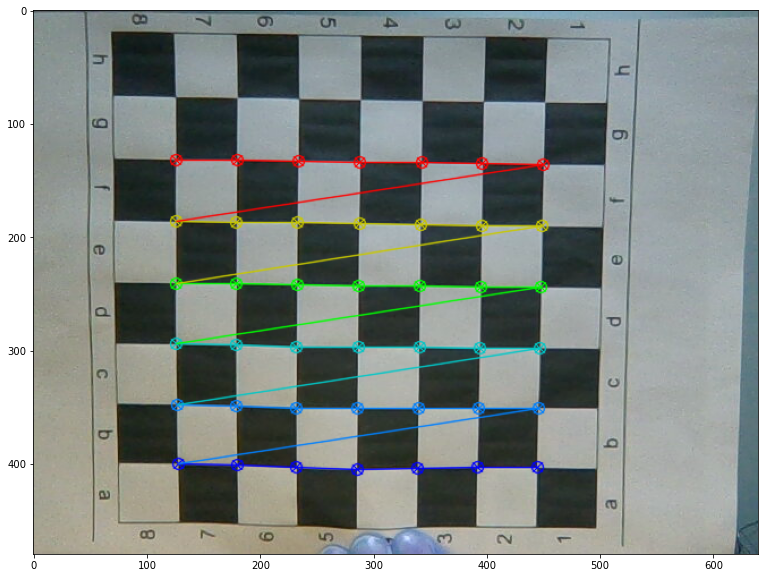

images-chris/chris-10.jpg


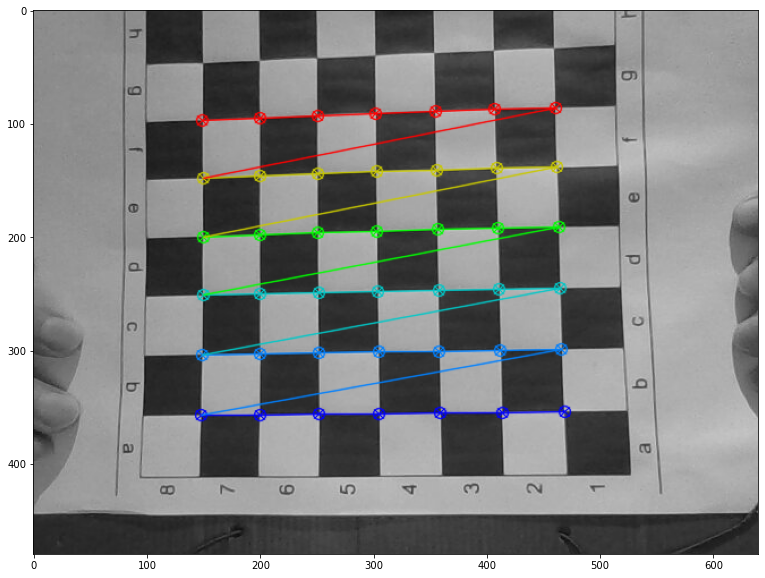

images-chris/chris-11.jpg


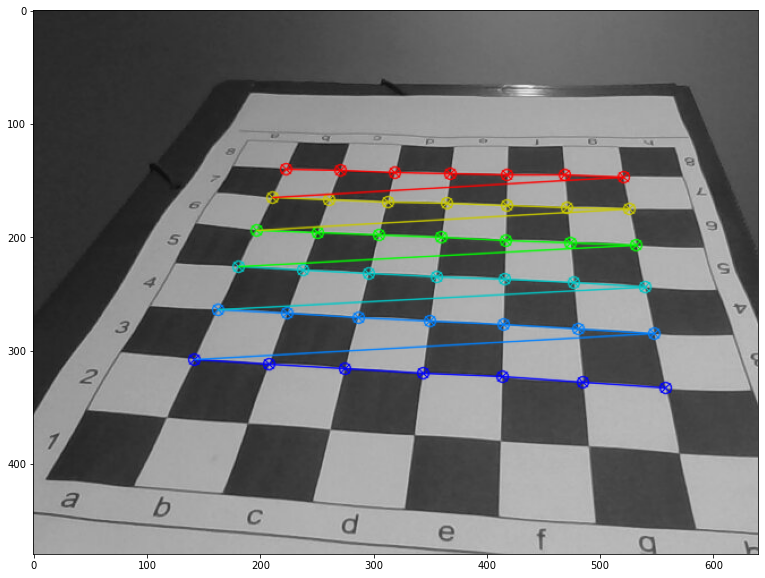

images-chris/chris-2.jpg


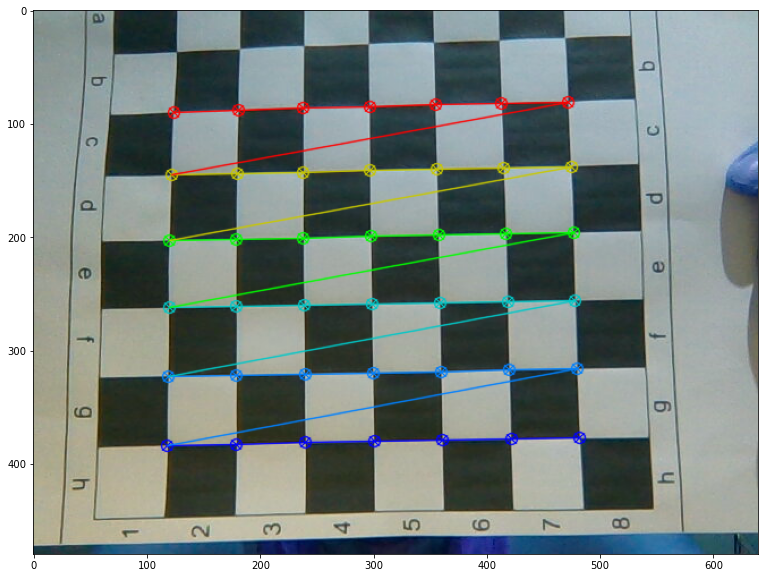

images-chris/chris-3.jpg


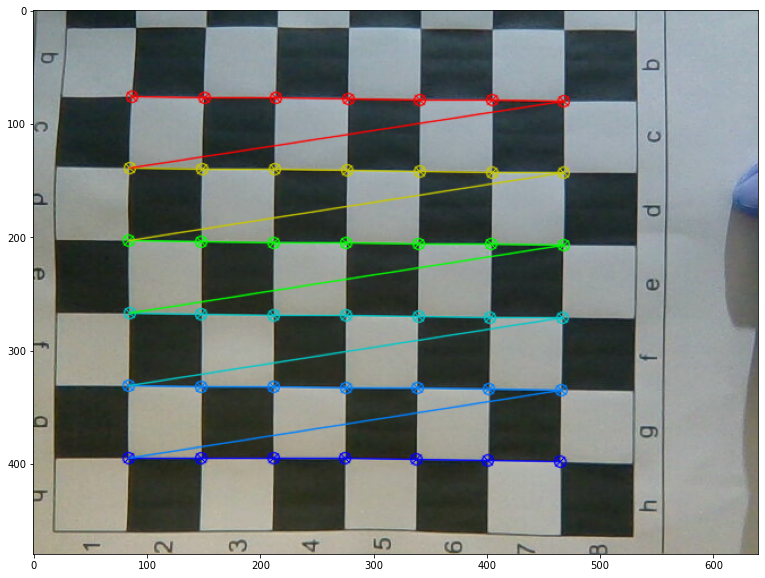

images-chris/chris-4.jpg


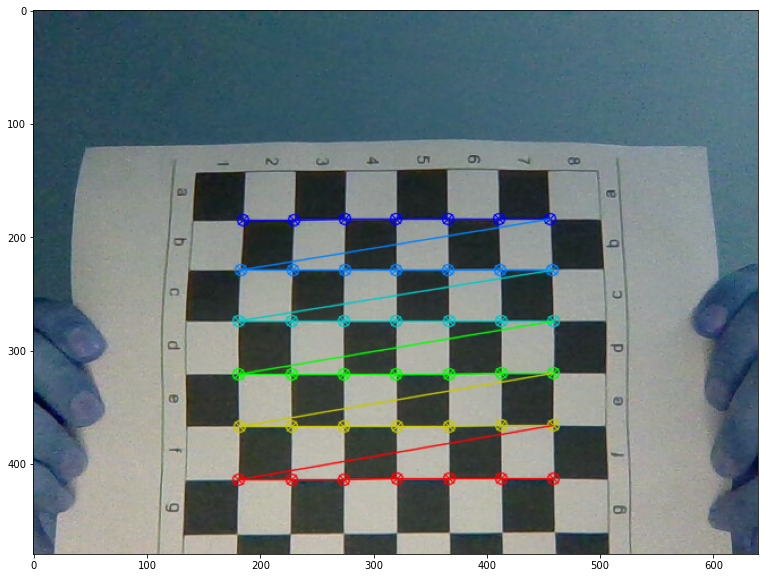

images-chris/chris-5.jpg


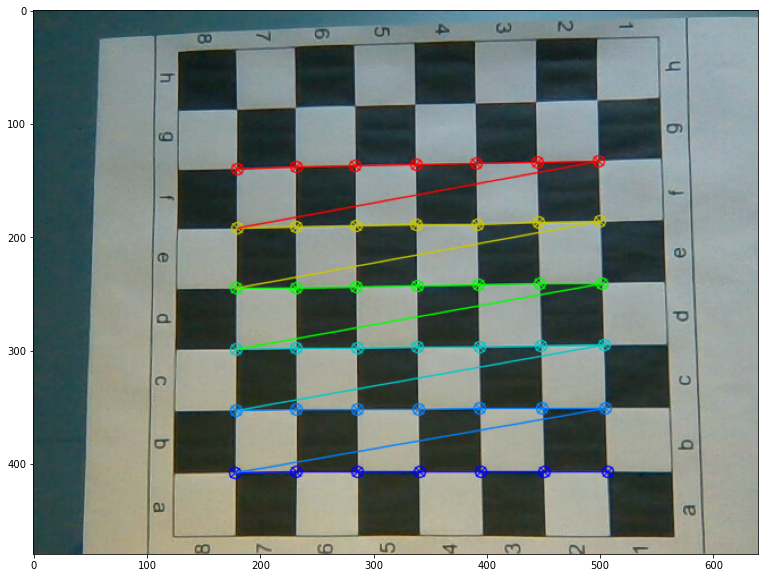

images-chris/chris-6.jpg


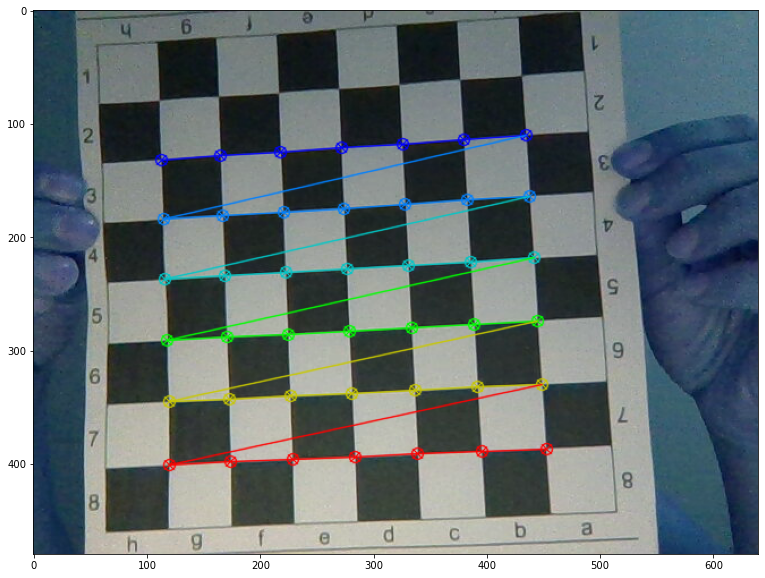

images-chris/chris-7.jpg


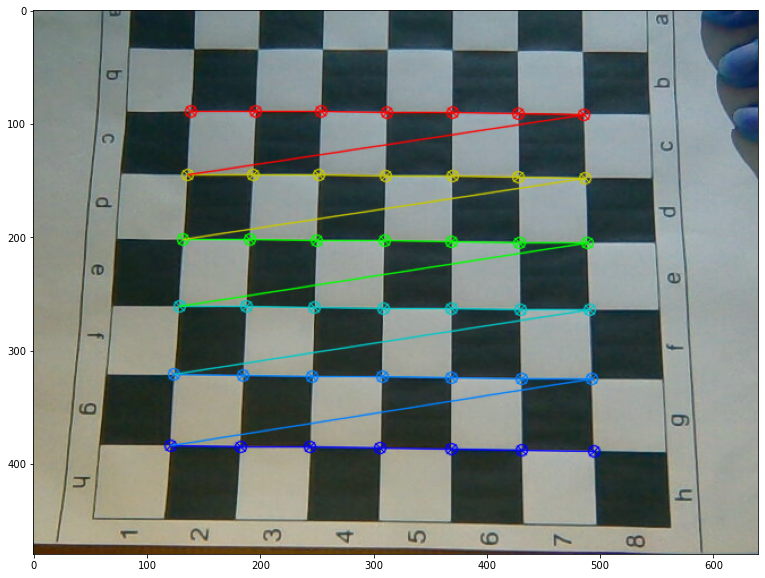

images-chris/chris-8.jpg


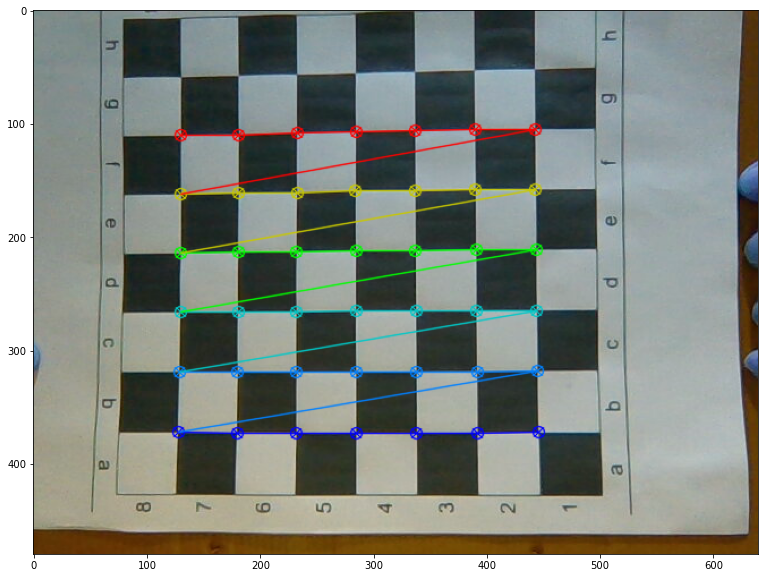

images-chris/chris-9.jpg


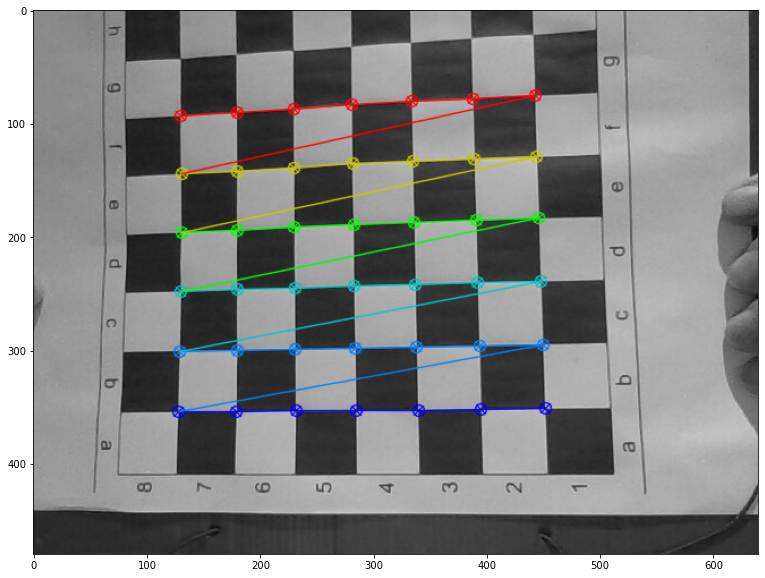

In [3]:
for fname in images:

    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (7,6), None)

    # If found, add object points, image points (after refining them)
    if ret == True:

        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv.drawChessboardCorners(img, (7,6), corners2, True)

#     if(bool(random.getrandbits(1))):
    print(fname)
    plt.imshow(img)
    plt.show()


## Calibrando

In [4]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Calculando a distância

In [5]:
K = np.transpose(mtx) #intrinsic parameters matrix
# R,_ = cv.Rodrigues(rvecs[0]) #rotation matrix from the given plane
# R = np.transpose(R)
# T = np.transpose(tvecs[0])
# RT = np.vstack((R[0,:], R[1,:], T)) # extrinsic parameters matrix considering planar image on Z
# P = np.matmul(RT,K) #projection matrix

In [6]:
print("Matriz K:")
print(K)

Matriz K:
[[660.67713696   0.           0.        ]
 [  0.         662.73004288   0.        ]
 [332.12000779 258.02884271   1.        ]]


## Distância do objeto da câmera, quando o tamanho no mundo é conhecido:


essa imagem foi tirada a ≃ 30cm da câmera


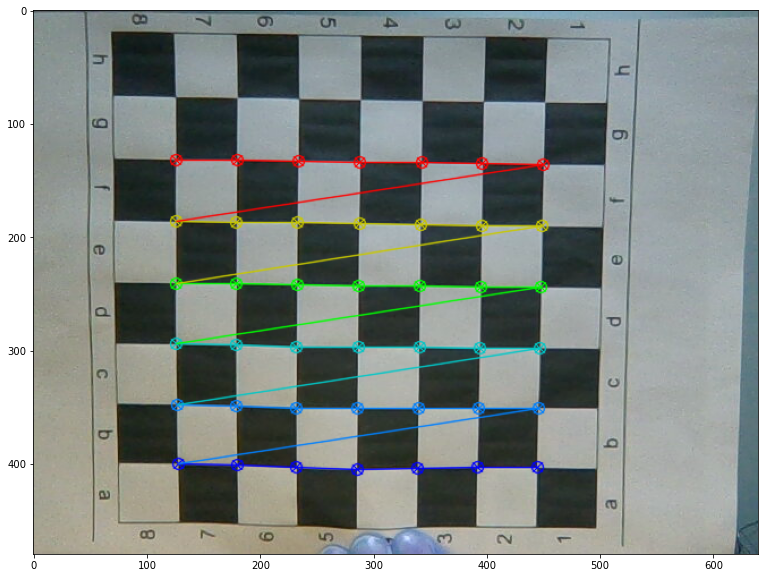

In [7]:
img = cv.imread("images-chris/chris-1.jpg")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# Find the chess board corners
ret, corners = cv.findChessboardCorners(gray, (7,6), None)

# If found, add object points, image points (after refining them)
if ret == True:

    objpoints.append(objp)
    corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
    imgpoints.append(corners)

    # Draw and display the corners
    cv.drawChessboardCorners(img, (7,6), corners2, True)

#     if(bool(random.getrandbits(1))):
print("essa imagem foi tirada a ≃ 30cm da câmera")
plt.imshow(img)
plt.show()

### Pegando a altura em pixels, na imagem

In [8]:
print(imgpoints[0].shape)
print("primeiro ponto: ", imgpoints[0][0])

(42, 1, 2)
primeiro ponto:  [[444.55536 403.3717 ]]


In [9]:
print(imgpoints[0].shape)
print("ponto 36: ", imgpoints[0][35])

(42, 1, 2)
ponto 36:  [[450.29584 136.19176]]


In [10]:
print("distância entre a borda superior esquerda e a inferior esquerda:")
print("como a imagem não está reta, há uma diferença de 5px no eixo y")
imgpoints[0][0] - imgpoints[0][35]

distância entre a borda superior esquerda e a inferior esquerda:
como a imagem não está reta, há uma diferença de 5px no eixo y


array([[ -5.7404785, 267.17993  ]], dtype=float32)

In [11]:
height_pixels = (imgpoints[0][0] - imgpoints[0][35])[0][1]
height_pixels

267.17993

### Cada quadrado possui 2.35cm, portanto, 5 quadrados de distância são:

5 * 2.35 cm = 11.75 cm (117.5mm)

### Para calcular a distância:

Distância = (Altura no mundo real * distância focal) / Altura em pixels, na imagem

D’ = (W x F) / P

In [12]:
dist = 11.75 * K[0,0] / height_pixels
print("distância em cm:", dist)

distância em cm: 29.05516260751532


## Altura do objeto no mundo real, quando a distância é conhecida:

29 = height_world * f / height_pixels

height_world * f = height_pixels * 29

In [13]:
height_world = (height_pixels * 29 ) / K[0,0]
print("altura em cm:", height_world)

altura em cm: 11.727692066395893


### Outra forma de definir a matriz P

In [14]:
# Cria uma matriz zerada para incluir os dados dos vetores de rotação
rotation_mat = np.zeros(shape=(3, 3))

# Preenche a matriz com os vetores de rotação devolvidos pelo OpenCV
R = cv.Rodrigues(rvecs[0], rotation_mat)[0]

# Computa a matriz P, multiplicando a matriz de intrínsecos K pela 
# matriz de rotação, e o vetor de translação
P = np.column_stack( ( np.matmul(mtx.T,R), tvecs[0] ) )

In [15]:
P.shape

(3, 4)

In [16]:
print(P)

[[-660.61820239    7.8365468    -4.05690909    2.12991595]
 [  -7.65375898 -661.90100329  -32.24269759    2.74656626]
 [-335.07702368 -253.81523486  -13.59404279   12.39233442]]
